# Agrupamento

In [1]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from sklearn.preprocessing import StandardScaler

 # K-means

## Base idade e salário

In [2]:
from sklearn.cluster import KMeans

In [3]:
x=[20,  27,  21,  37,  46, 53, 55,  47,  52,  32,  39,  41,  39,  48,  48]  
y=[1000,1200,2900,1850,900,950,2000,2100,3000,5900,4100,5100,7000,5000,6500]  

In [4]:
grafico = px.scatter(x=x, y=y)
grafico.show()

Iremos unir essas duas variáveis e colocar em formato de matriz

In [5]:
base_salario = np.array([[20,1000],[27,1200],[21,2900],[37,1850],[46,900],
                        [53,950],[55,2000],[47,2100],[52,3000],[32,5900],
                        [39,4100],[41,5100],[39,7000],[48,5000],[48,6500]])

In [6]:
base_salario

array([[  20, 1000],
       [  27, 1200],
       [  21, 2900],
       [  37, 1850],
       [  46,  900],
       [  53,  950],
       [  55, 2000],
       [  47, 2100],
       [  52, 3000],
       [  32, 5900],
       [  39, 4100],
       [  41, 5100],
       [  39, 7000],
       [  48, 5000],
       [  48, 6500]])

Iremos padronizar esses valores

In [7]:
scaler_salario = StandardScaler()
base_salario = scaler_salario.fit_transform(base_salario)

Com os dados padronizados, podemos enviá-los ao algoritmo.

In [8]:
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

A inicialização padrão é feita pelo k-mean++

In [9]:
kmeans_salario = KMeans(n_clusters=3)
kmeans_salario.fit(base_salario)

KMeans(n_clusters=3)

Observando os centróides

In [10]:
centroides = kmeans_salario.cluster_centers_
centroides

array([[ 0.07703438,  1.11413572],
       [ 0.73953003, -0.72661025],
       [-1.63312883, -0.77505093]])

In [11]:
scaler_salario.inverse_transform(kmeans_salario.cluster_centers_)

array([[  41.16666667, 5600.        ],
       [  48.33333333, 1800.        ],
       [  22.66666667, 1700.        ]])

Podemos olhar os rótulos de cada registro

In [12]:
rotulos = kmeans_salario.labels_
rotulos

array([2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0])

In [13]:
grafico1 = px.scatter(x=base_salario[:, 0], y=base_salario[:, 1], color=rotulos, title='Clusterização com K-mean')
grafico2 = px.scatter(x=centroides[:, 0], y=centroides[:, 1], size=[10, 10, 10])
grafico3 = go.Figure(data= grafico1.data + grafico2.data)
grafico3.show()

## Dados randômicos

In [14]:
from sklearn.datasets import make_blobs

In [15]:
X_random, y_random = make_blobs(n_samples=200, 
                                centers=5, random_state=1)

In [16]:
grafico = px.scatter(x=X_random[:, 0] , y=X_random[:, 1])
grafico.show()

In [17]:
kmeans_blobs = KMeans(n_clusters=5)
kmeans_blobs.fit(X_random)

KMeans(n_clusters=5)

In [18]:
rotulos = kmeans_blobs.labels_
rotulos

array([3, 1, 0, 1, 1, 0, 4, 0, 1, 3, 0, 0, 0, 2, 0, 3, 3, 2, 1, 1, 3, 0,
       4, 0, 4, 2, 1, 4, 4, 2, 1, 4, 3, 0, 1, 3, 2, 1, 2, 3, 2, 2, 4, 4,
       1, 4, 2, 0, 1, 4, 3, 0, 0, 3, 0, 2, 3, 0, 1, 1, 2, 0, 0, 0, 1, 4,
       3, 2, 4, 1, 2, 4, 1, 4, 4, 2, 1, 2, 3, 4, 2, 2, 0, 1, 0, 3, 1, 1,
       1, 2, 4, 0, 3, 4, 0, 2, 4, 3, 1, 2, 3, 1, 4, 2, 4, 1, 2, 1, 0, 3,
       0, 0, 1, 2, 0, 3, 2, 4, 3, 3, 1, 2, 2, 0, 3, 2, 1, 4, 1, 4, 3, 4,
       0, 0, 2, 2, 0, 3, 3, 0, 0, 0, 3, 3, 4, 1, 4, 3, 1, 0, 4, 0, 3, 4,
       0, 2, 2, 2, 3, 1, 4, 3, 2, 3, 4, 2, 2, 2, 0, 4, 2, 4, 4, 0, 3, 1,
       4, 0, 1, 3, 1, 3, 3, 1, 2, 4, 2, 3, 3, 0, 1, 4, 3, 2, 2, 4, 0, 4,
       1, 2])

In [19]:
centroides = kmeans_blobs.cluster_centers_
centroides

array([[-5.90368078, -3.04489641],
       [-6.87958999, -8.11648104],
       [-9.85620522, -3.91021738],
       [-1.58338528,  4.50520457],
       [-2.17069756,  1.02591979]])

In [20]:
grafico1 = px.scatter(x=X_random[:, 0], y=X_random[:, 1], color=rotulos)
grafico2 = px.scatter(x=centroides[:, 0], y=centroides[:, 1], size=[10, 10, 10, 10, 10])
grafico3 = go.Figure(data= grafico1.data + grafico2.data)
grafico3.show()

## Base de dados cartão de crédito - 1 atributo

- Fonte: https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients

Originalmente, é uma base de dados para previsão se uma pessoa irá pagar a próxima fatura com base no histórico dos 6 meses anteriores.

Porém, tentaremos encontrar padrões entre o limite do cartão de crédito e o valor total das últimas fatoras

In [21]:
import pandas as pd
base_cartao = pd.read_csv('credit_card_clients.csv', header=1)
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


Contabilizando o quanto o cliente está devendo (valor total)

In [22]:
base_cartao['BILL_TOTAL'] = base_cartao['BILL_AMT1'] + base_cartao['BILL_AMT2'] + base_cartao['BILL_AMT3'] + base_cartao['BILL_AMT4'] + base_cartao['BILL_AMT5'] + base_cartao['BILL_AMT6']

In [23]:
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,689,0,0,0,0,1,7704
1,2,120000,2,2,2,26,-1,2,0,0,...,3455,3261,0,1000,1000,1000,0,2000,1,17077
2,3,90000,2,2,2,34,0,0,0,0,...,14948,15549,1518,1500,1000,1000,1000,5000,0,101653
3,4,50000,2,2,1,37,0,0,0,0,...,28959,29547,2000,2019,1200,1100,1069,1000,0,231334
4,5,50000,1,2,1,57,-1,0,-1,0,...,19146,19131,2000,36681,10000,9000,689,679,0,109339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,725349
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,5190,0,1837,3526,8998,129,0,0,0,21182
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20582,19357,0,0,22000,4200,2000,3100,1,70496
29998,29999,80000,1,3,1,41,1,-1,0,0,...,11855,48944,85900,3409,1178,1926,52964,1804,1,266611


Criando uma variável X

In [24]:
X_cartao = base_cartao.iloc[:, [1, 25]].values
X_cartao

array([[ 20000,   7704],
       [120000,  17077],
       [ 90000, 101653],
       ...,
       [ 30000,  70496],
       [ 80000, 266611],
       [ 50000, 230874]], dtype=int64)

In [25]:
scaler_cartao = StandardScaler()
X_cartao = scaler_cartao.fit_transform(X_cartao)
X_cartao

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

Iremos aplicar o Elbow Method para descobrirmos o valor de k clusters ideais para esse problema

- .inertia_ -> obtém o wcss com uma quantidade i de clusters

In [26]:
wcss =[]
for i in range(1, 11):
    kmeans_cartao = KMeans(n_clusters=i)
    kmeans_cartao.fit(X_cartao)
    wcss.append(kmeans_cartao.inertia_)

In [27]:
wcss

[60000.00000000003,
 35197.679380838046,
 20128.143951140028,
 14943.801288165876,
 10707.233580155133,
 8603.428841321134,
 7397.830631793331,
 6351.6950964733915,
 5666.192422867619,
 5051.613274774363]

In [28]:
grafico = px.line(x=range(1, 11), y=wcss)
grafico.show()

Usando o Elbow Method, iremos fazer agrupamentos ou com 4 ou 5 clusters.

Com um valor de clusters definido, podemos treinar o modelo.

In [29]:
kmeans_cartao = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao.fit_predict(X_cartao)

In [30]:
centroides = kmeans_cartao.cluster_centers_
centroides

array([[-0.70300068, -0.34913734],
       [ 1.1000398 , -0.45367287],
       [ 1.61393477,  3.38061824],
       [ 0.16679768,  1.16289356]])

Iremos criar o gráfico com os registros diferenciados pela cor com base nos rótulos. Repare que aqui não geramos os centróides.

In [31]:
grafico = px.scatter(x=X_cartao[:, 0], y=X_cartao[:, 1], color=rotulos)
grafico1 = px.scatter(x=centroides[:, 0], y=centroides[:, 1], size= [10, 10, 10, 10])
grafico2 = go.Figure(data= grafico1.data + grafico.data)
grafico2.show()

Insighs com os grupos:
- Grupo azul (pessoas com limite baixo e não gastam tanto): talvez não é interessante o banco aumenta o limite dessas pessoas;
- Grupo rosa (limite alto e não gastam tanto): não parece interessante aumentar o limite dessas pessoas;
- Grupo amarelo (limite mediano e gasto mediano): talvez seja interessante o aumento do limite para as pessoas localizadas mais ao topo do grupo;
- Grupo laranja (limite alto e gasto alto): talvez seja interessante aumentar o limite (para aumentar possíveis gastos).

Para enviarmos uma lista dos clientes segmentados por grupo

In [32]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [     2, 120000,      2, ...,      1,  17077,      0],
       [     3,  90000,      2, ...,      0, 101653,      0],
       ...,
       [ 29998,  30000,      1, ...,      1,  70496,      0],
       [ 29999,  80000,      1, ...,      1, 266611,      0],
       [ 30000,  50000,      1, ...,      1, 230874,      0]], dtype=int64)

Ordenamos pelo atributo do rótulo

In [33]:
lista_clientes = lista_clientes[lista_clientes[:, 26].argsort()]
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 16789,  30000,      1, ...,      1,  14274,      0],
       [ 16788,  30000,      1, ...,      1,  90453,      0],
       ...,
       [ 20882, 110000,      1, ...,      0, 554308,      3],
       [ 20744, 220000,      1, ...,      0, 452961,      3],
       [ 20270, 150000,      2, ...,      0, 546939,      3]], dtype=int64)

In [34]:
lista_clientes_column = pd.DataFrame(rotulos)
lista_clientes_column

,0
0,0
1,0
2,0
3,0
4,0
...,...
29995,3
29996,0
29997,0
29998,0


In [35]:
lista_clientes_dt = pd.concat([base_cartao, lista_clientes_column], axis=1)
lista_clientes_dt

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL,0
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,689,0,0,0,0,1,7704,0
1,2,120000,2,2,2,26,-1,2,0,0,...,3261,0,1000,1000,1000,0,2000,1,17077,0
2,3,90000,2,2,2,34,0,0,0,0,...,15549,1518,1500,1000,1000,1000,5000,0,101653,0
3,4,50000,2,2,1,37,0,0,0,0,...,29547,2000,2019,1200,1100,1069,1000,0,231334,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,19131,2000,36681,10000,9000,689,679,0,109339,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,15980,8500,20000,5003,3047,5000,1000,0,725349,3
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,0,1837,3526,8998,129,0,0,0,21182,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,19357,0,0,22000,4200,2000,3100,1,70496,0
29998,29999,80000,1,3,1,41,1,-1,0,0,...,48944,85900,3409,1178,1926,52964,1804,1,266611,0


In [36]:
lista_clientes_dt = lista_clientes_dt.rename(columns={0:'RÓTULO'})
lista_clientes_dt

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL,RÓTULO
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,689,0,0,0,0,1,7704,0
1,2,120000,2,2,2,26,-1,2,0,0,...,3261,0,1000,1000,1000,0,2000,1,17077,0
2,3,90000,2,2,2,34,0,0,0,0,...,15549,1518,1500,1000,1000,1000,5000,0,101653,0
3,4,50000,2,2,1,37,0,0,0,0,...,29547,2000,2019,1200,1100,1069,1000,0,231334,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,19131,2000,36681,10000,9000,689,679,0,109339,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,15980,8500,20000,5003,3047,5000,1000,0,725349,3
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,0,1837,3526,8998,129,0,0,0,21182,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,19357,0,0,22000,4200,2000,3100,1,70496,0
29998,29999,80000,1,3,1,41,1,-1,0,0,...,48944,85900,3409,1178,1926,52964,1804,1,266611,0


Daríamos para separar em bases diferentes os grupos de clientes.

In [37]:
clientes_zero = lista_clientes_dt[lista_clientes_dt['RÓTULO'] == 0]
clientes_zero

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL,RÓTULO
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,689,0,0,0,0,1,7704,0
1,2,120000,2,2,2,26,-1,2,0,0,...,3261,0,1000,1000,1000,0,2000,1,17077,0
2,3,90000,2,2,2,34,0,0,0,0,...,15549,1518,1500,1000,1000,1000,5000,0,101653,0
3,4,50000,2,2,1,37,0,0,0,0,...,29547,2000,2019,1200,1100,1069,1000,0,231334,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,19131,2000,36681,10000,9000,689,679,0,109339,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29994,29995,80000,1,2,2,34,2,2,2,2,...,81158,7000,3500,0,7000,0,4000,1,470933,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,0,1837,3526,8998,129,0,0,0,21182,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,19357,0,0,22000,4200,2000,3100,1,70496,0
29998,29999,80000,1,3,1,41,1,-1,0,0,...,48944,85900,3409,1178,1926,52964,1804,1,266611,0


## Base de dados cartão de crédito - mais atributos

In [38]:
base_cartao.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month', 'BILL_TOTAL'],
      dtype='object')

In [39]:
X_cartao_more = base_cartao.iloc[:, [1, 2, 3, 4, 5, 25]].values
X_cartao_more

array([[ 20000,      2,      2,      1,     24,   7704],
       [120000,      2,      2,      2,     26,  17077],
       [ 90000,      2,      2,      2,     34, 101653],
       ...,
       [ 30000,      1,      2,      2,     37,  70496],
       [ 80000,      1,      3,      1,     41, 266611],
       [ 50000,      1,      2,      1,     46, 230874]], dtype=int64)

Padronizando os dados

In [40]:
from sklearn.preprocessing import StandardScaler
scaler_cartao_more = StandardScaler()
X_cartao_more = scaler_cartao_more.fit_transform(X_cartao_more)

In [41]:
X_cartao_more

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.69069198],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.66599747],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.44316987],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.52525745],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.00856436],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.10271861]])

Iremos gerar o wcss para descobrirmos o número ideal de clusters

In [42]:
wcss = []
for i in range(1, 11):
    kmeans_cartao_mais = KMeans(n_clusters=i, random_state=0)
    kmeans_cartao_mais.fit(X_cartao_more)
    wcss.append(kmeans_cartao_mais.inertia_)

Gerando o gráfico de lina com os marcadores para aplicarmos a técnica do **Elbow Point**. 

In [60]:
n_clusters = list(range(1, 11))
n_clusters

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [63]:
grafico = px.line(x=range(1, 11), y=wcss, title='WCSS para cada valor de k', markers=True, color=n_clusters)
grafico.update_layout(xaxis_title="Número de clusters",
    yaxis_title="WCSS")
grafico.show()

Podemos escolher 4, 5 ou 6 clusters.

In [64]:
kmeans_cartao_mais = KMeans(n_clusters=4, random_state=0)
kmeans_cartao_mais.fit(X_cartao_more)
rotulos = kmeans_cartao_mais.labels_
centroides = kmeans_cartao_mais.cluster_centers_

In [65]:
rotulos, centroides

(array([1, 0, 0, ..., 3, 1, 1]),
 array([[-0.11877368,  0.81016074, -0.23447569,  0.88107335, -0.58880188,
         -0.22695204],
        [-0.00660378,  0.09518186,  0.24254121, -1.01194296,  0.56310657,
         -0.25584507],
        [ 1.22408276, -0.12034642, -0.1399552 , -0.18678281,  0.25643996,
          2.48251227],
        [-0.3320472 , -1.23432296, -0.09032767,  0.82766128, -0.38974721,
         -0.22569198]]))

Não podemos fazer a visualização do gráfico para esse experimento porque temos mais atributos. Para contornar isso:
- iremos aplicar a técnica chamada PCA (principal component analysis). Ela é utilizada para redução de dimensionalidade.
- Iremos combinar os 5 atributos para chegarmos em apenas 2.
- Com apenas dois atributos, podemos plotar um gráfico.

In [66]:
from sklearn.decomposition import PCA

In [67]:
pca = PCA(n_components=2)
X_cartao_more_pca = pca.fit_transform(X_cartao_more)

30k de registros e apenas 2 atributos

In [68]:
X_cartao_more_pca.shape

(30000, 2)

In [69]:
X_cartao_more_pca

array([[-0.74082054, -1.13671858],
       [-1.48027121, -0.30100547],
       [-0.94737386, -0.48666789],
       ...,
       [-0.79468657, -0.90012663],
       [ 1.17562376, -1.54746987],
       [ 1.13614987, -1.14039836]])

In [70]:
grafico = px.scatter(x=X_cartao_more_pca[:, 0], y=X_cartao_more_pca[:, 1], color=rotulos)
grafico.show()

Da mesma maneira, podemos unir os rótulos obtidos para gerarmos um novo DataFrame com uma coluna a mais. 

# Agrupamento hierárquico

## Base salário idade

Primeira coluna: idade
Segunda coluna: salário

In [71]:
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [72]:
grafico = px.scatter(x=base_salario[:, 0], y=base_salario[:, 1])
grafico.show()

Iremos gerar um dendograma para conseguirmos definir um número de clusters.

In [73]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

É interessante realizar testes com outros métodos

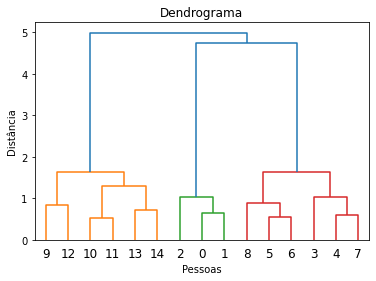

In [77]:
dendrograma = dendrogram(linkage(base_salario, method='ward'))
plt.title('Dendrograma')
plt.xlabel('Pessoas')
plt.ylabel('Distância');

As melhores e maiores linhas verticais são as que não possuem ao cruzamentos.

Iremos traçar uma linha horizontal e chegamos na conclusão de 3 clusters.

Importando o algoritmo:

In [78]:
from sklearn.cluster import AgglomerativeClustering

In [80]:
hiec_salario= AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean')
rotulos = hiec_salario.fit_predict(base_salario)

In [81]:
rotulos

array([2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], dtype=int64)

Podemos gerar o gráfico para analisarmos cada um dos registros e seus respectivos rótulos.

In [82]:
grafico = px.scatter(x=base_salario[:, 0], y=base_salario[:, 1], color=rotulos)
grafico.show()

## Base cartão de crédito

In [83]:
X_cartao

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

A geração do dendrograma pode demorar bastante por conta dos 30k de registros.

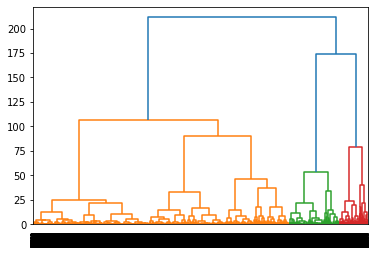

In [84]:
dendrograma = dendrogram(linkage(X_cartao, method='ward'))

Teremos 3 cruzamentos = 3 clusters

In [91]:
hc_cartao = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
rotulos = hc_cartao.fit_predict(X_cartao)

In [92]:
rotulos

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

Gerando o gráfico

In [93]:
grafico = px.scatter(x=X_cartao[:, 0], y=X_cartao[:, 1], color=rotulos)
grafico.show()